We perform PCA and UMAP on the QC-filtered, normalized [HT_raw_processed.h5ad](data/raw/HT_raw_processed.h5ad) dataset generated in [HT_raw.ipynb](HT_raw.ipynb). We follow standard practices for single-cell dimensionality reduction (Kobak & Berens 2019, Becht et al. 2019).

In [19]:
import importlib.metadata as im
import json
import subprocess
from datetime import datetime
from itertools import combinations
from pathlib import Path

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
import scipy
import seaborn as sns
from matplotlib.patches import Patch
from scipy import sparse
from scipy.sparse import csgraph
from scipy.spatial import procrustes
from sklearn.metrics import adjusted_rand_score

In [2]:
# Set random seed for reproducibility
RANDOM_SEED = 42
rng = np.random.default_rng(RANDOM_SEED)
sc.settings.seed = RANDOM_SEED

print(f"Scanpy version: {im.version('scanpy')}")
print(f"AnnData version: {im.version('anndata')}")
print(f"Random seed: {RANDOM_SEED}")
print(f"RNG type: numpy.random.Generator (default_rng)")

Scanpy version: 1.12
AnnData version: 0.12.10
Random seed: 42
RNG type: numpy.random.Generator (default_rng)


In [3]:
# Load the processed dataset (read-only input; we will write to a separate path)
H5AD_PATH = Path("data/raw/HT_raw_processed.h5ad")

if not H5AD_PATH.exists():
    raise FileNotFoundError(f"Processed dataset not found at {H5AD_PATH}")

print("Loading processed dataset...")
adata = ad.read_h5ad(H5AD_PATH)

print(f"Nuclei: {adata.n_obs:,}")
print(f"Genes: {adata.n_vars:,}")
print(f"Layers: {list(adata.layers.keys())}")
print(f"Data matrix format: {type(adata.X).__name__}")

# Verify data is normalized and log-transformed (sparse-safe)
if sparse.issparse(adata.X):
    x_min, x_max = adata.X.data.min(), adata.X.data.max()
    print(f"\nData range (nonzero): [{x_min:.3f}, {x_max:.3f}]")
else:
    print(f"\nData range: [{adata.X.min():.3f}, {adata.X.max():.3f}]")

# Cast hugo_symbol to string once to prevent Categorical .str method issues
if "hugo_symbol" in adata.var.columns:
    adata.var["hugo_symbol"] = adata.var["hugo_symbol"].astype("string")
    print("✓ hugo_symbol cast to string dtype (avoids Categorical edge cases)")

print("✓ Dataset loaded successfully")

Loading processed dataset...
Nuclei: 23,279
Genes: 29,072
Layers: ['counts']
Data matrix format: csr_matrix

Data range (nonzero): [0.000, 8.755]
✓ hugo_symbol cast to string dtype (avoids Categorical edge cases)
✓ Dataset loaded successfully


Principal Component Analysis (PCA)

In [4]:
# PCA configuration
N_COMPS = 50  # Number of principal components (use 30 if memory issues occur)

print(f"Running PCA with {N_COMPS} components...")
print(f"  → Input: {adata.n_obs:,} nuclei × {adata.n_vars:,} genes")

try:
    sc.tl.pca(adata, n_comps=N_COMPS, random_state=RANDOM_SEED)
    print(f"✓ PCA completed successfully")
    print(f"  → Output: X_pca shape = {adata.obsm['X_pca'].shape}")

    # Variance explained
    variance_ratio = adata.uns["pca"]["variance_ratio"]
    cumvar = np.cumsum(variance_ratio)

    print(f"\nVariance explained:")
    print(f"  PC1-10: {cumvar[9]:.2%}")
    print(f"  PC1-20: {cumvar[19]:.2%}")
    print(f"  PC1-30: {cumvar[29]:.2%}")
    print(f"  PC1-{N_COMPS}: {cumvar[-1]:.2%}")

except MemoryError:
    print("⚠ Memory error with 50 components, retrying with 30...")
    N_COMPS = 30
    sc.tl.pca(adata, n_comps=N_COMPS, random_state=RANDOM_SEED)
    print(f"✓ PCA completed with {N_COMPS} components")
    print(f"  → Output: X_pca shape = {adata.obsm['X_pca'].shape}")

Running PCA with 50 components...
  → Input: 23,279 nuclei × 29,072 genes
✓ PCA completed successfully
  → Output: X_pca shape = (23279, 50)

Variance explained:
  PC1-10: 11.40%
  PC1-20: 12.56%
  PC1-30: 13.44%
  PC1-50: 14.95%


Compute Neighborhood Graph

In [5]:
# Neighbors configuration
N_NEIGHBORS = 15  # Number of neighbors for graph construction
N_PCS = N_COMPS  # Use all PCs computed in previous step

print(f"Computing neighborhood graph...")
print(f"  → n_neighbors = {N_NEIGHBORS}")
print(f"  → n_pcs = {N_PCS}")
print(f"  → metric = euclidean")

sc.pp.neighbors(
    adata,
    n_neighbors=N_NEIGHBORS,
    n_pcs=N_PCS,
    random_state=RANDOM_SEED,
    metric="euclidean",
)

print(f"✓ Neighborhood graph computed")
print(f"  → Connectivities: {adata.obsp['connectivities'].shape}")
print(f"  → Distances: {adata.obsp['distances'].shape}")

Computing neighborhood graph...
  → n_neighbors = 15
  → n_pcs = 50
  → metric = euclidean


/Users/cytronicoder/Documents/GitHub/biorsp-topaz/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


✓ Neighborhood graph computed
  → Connectivities: (23279, 23279)
  → Distances: (23279, 23279)


UMAP Embedding

In [6]:
# UMAP configuration
MIN_DIST = 0.3  # Minimum distance between points in UMAP space
SPREAD = 1.0  # Scale of embedded points

print(f"Computing UMAP embedding...")
print(f"  → random_state = {RANDOM_SEED}")
print(f"  → min_dist = {MIN_DIST}")
print(f"  → spread = {SPREAD}")

sc.tl.umap(adata, min_dist=MIN_DIST, spread=SPREAD, random_state=RANDOM_SEED)

print(f"✓ UMAP embedding computed")
print(f"  → X_umap shape: {adata.obsm['X_umap'].shape}")

Computing UMAP embedding...
  → random_state = 42
  → min_dist = 0.3
  → spread = 1.0
✓ UMAP embedding computed
  → X_umap shape: (23279, 2)


In [7]:
expected_shape = (adata.n_obs, 2)
actual_shape = adata.obsm["X_umap"].shape

print("Quality Gate: UMAP Shape Validation")
print(f"  Expected: {expected_shape}")
print(f"  Actual:   {actual_shape}")

if actual_shape == expected_shape:
    print("✓ PASSED: UMAP embedding has correct dimensions")
else:
    raise ValueError(
        f"FAILED: UMAP shape mismatch! Expected {expected_shape}, got {actual_shape}"
    )

# Additional sanity checks
umap_coords = adata.obsm["X_umap"]
has_nan = np.isnan(umap_coords).any()
has_inf = np.isinf(umap_coords).any()

print(f"\nData integrity checks:")
print(f"  NaN values: {'PRESENT ⚠' if has_nan else 'None ✓'}")
print(f"  Inf values: {'PRESENT ⚠' if has_inf else 'None ✓'}")
print(f"  Coordinate range: [{umap_coords.min():.2f}, {umap_coords.max():.2f}]")

if not has_nan and not has_inf:
    print("\n✓ All quality gates passed - UMAP embedding is valid")

Quality Gate: UMAP Shape Validation
  Expected: (23279, 2)
  Actual:   (23279, 2)
✓ PASSED: UMAP embedding has correct dimensions

Data integrity checks:
  NaN values: None ✓
  Inf values: None ✓
  Coordinate range: [-4.68, 16.76]

✓ All quality gates passed - UMAP embedding is valid


In [8]:
# Record provenance
try:
    git_hash = subprocess.check_output(
        ["git", "rev-parse", "HEAD"], text=True
    ).strip()
except Exception:
    git_hash = "unknown"

# Create parameter dictionary
embedding_params = {
    "seed": RANDOM_SEED,
    "pca": {"n_comps": N_COMPS, "variance_explained": float(cumvar[-1])},
    "neighbors": {"n_neighbors": N_NEIGHBORS, "n_pcs": N_PCS, "metric": "euclidean"},
    "umap": {"min_dist": MIN_DIST, "spread": SPREAD, "n_components": 2},
    "dataset": {
        "n_cells": int(adata.n_obs),
        "n_genes": int(adata.n_vars),
        "source": str(H5AD_PATH),
    },
    "provenance": {
        "git_commit": git_hash,
        "timestamp": datetime.now().isoformat(),
        "scanpy_version": sc.__version__,
        "anndata_version": ad.__version__,
    },
}

# Save to JSON
params_path = Path("data/processed/embedding_params.json")
params_path.parent.mkdir(parents=True, exist_ok=True)

with open(params_path, "w") as f:
    json.dump(embedding_params, f, indent=2)

print(f"✓ Parameters saved to: {params_path}")
print(f"\nSummary:")
for key, value in embedding_params.items():
    if isinstance(value, dict):
        print(f"  {key}:")
        for k, v in value.items():
            print(f"    {k}: {v}")
    else:
        print(f"  {key}: {value}")

✓ Parameters saved to: data/processed/embedding_params.json

Summary:
  seed: 42
  pca:
    n_comps: 50
    variance_explained: 0.1495421975851059
  neighbors:
    n_neighbors: 15
    n_pcs: 50
    metric: euclidean
  umap:
    min_dist: 0.3
    spread: 1.0
    n_components: 2
  dataset:
    n_cells: 23279
    n_genes: 29072
    source: data/raw/HT_raw_processed.h5ad
  provenance:
    git_commit: f1abb957800c8855261ddd17d2deab1c7af78f92
    timestamp: 2026-02-07T16:35:31.773127
    scanpy_version: 1.12
    anndata_version: 0.12.10


/var/folders/g4/m4yltzqj0c79mflv15hj0b3w0000gn/T/ipykernel_91634/3842183694.py:23: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  "scanpy_version": sc.__version__,
/var/folders/g4/m4yltzqj0c79mflv15hj0b3w0000gn/T/ipykernel_91634/3842183694.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  "anndata_version": ad.__version__,


In [9]:
# Save to a NEW file — never overwrite the raw input
OUT_PATH = Path("data/processed/HT_pca_umap.h5ad")
OUT_PATH.parent.mkdir(parents=True, exist_ok=True)

print(f"Saving dataset with embeddings...")
print(f"  Source (read-only): {H5AD_PATH}")
print(f"  Output: {OUT_PATH}")

adata.write_h5ad(OUT_PATH)

print(f"\n✓ Dataset saved to: {OUT_PATH}")
print(f"  obsm keys: {list(adata.obsm.keys())}")
print(f"  obsp keys: {list(adata.obsp.keys())}")
print(f"  uns keys: {list(adata.uns.keys())}")
print(f"  File size: {OUT_PATH.stat().st_size / (1024**2):.1f} MB")
print(f"  Git commit: {git_hash}")
print(f"\n✓ All steps completed successfully")
print(f"  → PCA: {N_COMPS} components")
print(f"  → Neighbors: {N_NEIGHBORS} neighbors using {N_PCS} PCs")
print(f"  → UMAP: {adata.obsm['X_umap'].shape} coordinates")
print(f"  → Parameters: {params_path}")

Saving dataset with embeddings...
  Source (read-only): data/raw/HT_raw_processed.h5ad
  Output: data/processed/HT_pca_umap.h5ad

✓ Dataset saved to: data/processed/HT_pca_umap.h5ad
  obsm keys: ['X_pca', 'X_umap']
  obsp keys: ['distances', 'connectivities']
  uns keys: ['annotation_metadata', 'cell_type_counts', 'creation_date_time', 'datasets', 'uuid', 'pca', 'neighbors', 'umap']
  File size: 216.2 MB
  Git commit: f1abb957800c8855261ddd17d2deab1c7af78f92

✓ All steps completed successfully
  → PCA: 50 components
  → Neighbors: 15 neighbors using 50 PCs
  → UMAP: (23279, 2) coordinates
  → Parameters: data/processed/embedding_params.json


Plotting

In [10]:
# Set publication-quality plotting parameters
plt.rcParams["figure.dpi"] = 300
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["font.size"] = 10
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["axes.linewidth"] = 1.0
plt.rcParams["xtick.major.width"] = 1.0
plt.rcParams["ytick.major.width"] = 1.0

# Create figures output directory
figures_dir = Path("outputs/figures_v1")
figures_dir.mkdir(parents=True, exist_ok=True)

print("Matplotlib configuration set for publication-quality figures")
print(f"Figures will be saved to: {figures_dir}")

Matplotlib configuration set for publication-quality figures
Figures will be saved to: outputs/figures_v1


S1: PCA variance

✓ Figure Sx1 saved: PCA variance explained
  PC1-50: 14.95% variance
  Elbow check: PC10=11.4%, PC20=12.6%


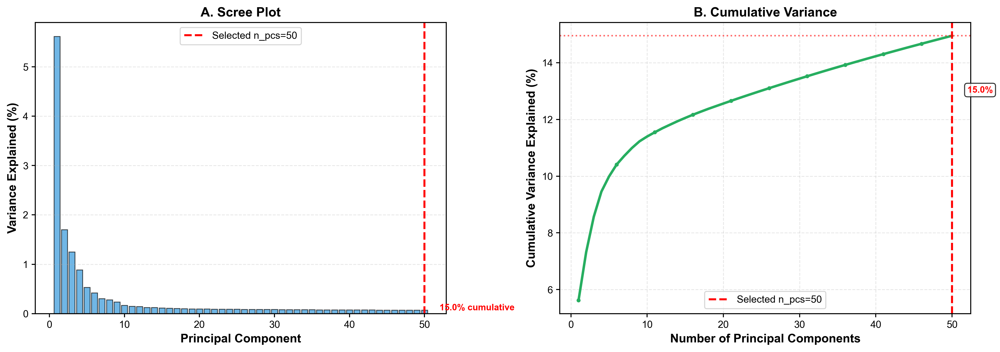

In [11]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Extract variance data
variance_ratio = adata.uns["pca"]["variance_ratio"]
cumvar = np.cumsum(variance_ratio)
pcs = np.arange(1, len(variance_ratio) + 1)

# Panel A: Scree plot
ax1.bar(
    pcs,
    variance_ratio * 100,
    color="#3498db",
    edgecolor="black",
    linewidth=0.8,
    alpha=0.7,
)
ax1.axvline(
    x=N_PCS, color="red", linestyle="--", linewidth=2, label=f"Selected n_pcs={N_PCS}"
)
ax1.set_xlabel("Principal Component", fontsize=12, fontweight="bold")
ax1.set_ylabel("Variance Explained (%)", fontsize=12, fontweight="bold")
ax1.set_title("A. Scree Plot", fontsize=13, fontweight="bold")
ax1.legend(frameon=True)
ax1.grid(axis="y", alpha=0.3, linestyle="--")

# Add text annotation
var_at_npc = cumvar[N_PCS - 1] * 100
ax1.text(
    N_PCS + 2,
    variance_ratio[N_PCS - 1] * 100,
    f"{var_at_npc:.1f}% cumulative",
    fontsize=9,
    color="red",
    fontweight="bold",
)

# Panel B: Cumulative variance
ax2.plot(
    pcs,
    cumvar * 100,
    color="#27ae60",
    linewidth=2.5,
    marker="o",
    markersize=3,
    markevery=5,
)
ax2.axvline(
    x=N_PCS, color="red", linestyle="--", linewidth=2, label=f"Selected n_pcs={N_PCS}"
)
ax2.axhline(y=var_at_npc, color="red", linestyle=":", linewidth=1.5, alpha=0.6)
ax2.set_xlabel("Number of Principal Components", fontsize=12, fontweight="bold")
ax2.set_ylabel("Cumulative Variance Explained (%)", fontsize=12, fontweight="bold")
ax2.set_title("B. Cumulative Variance", fontsize=13, fontweight="bold")
ax2.legend(frameon=True)
ax2.grid(True, alpha=0.3, linestyle="--")

# Add annotation
ax2.text(
    N_PCS + 2,
    var_at_npc - 2,
    f"{var_at_npc:.1f}%",
    fontsize=9,
    color="red",
    fontweight="bold",
    bbox=dict(boxstyle="round", facecolor="white", alpha=0.8),
)

plt.tight_layout()
plt.savefig(figures_dir / "Sx1_pca_variance_explained.png", bbox_inches="tight")
plt.savefig(figures_dir / "Sx1_pca_variance_explained.pdf", bbox_inches="tight")
print(f"✓ Figure Sx1 saved: PCA variance explained")
print(f"  PC1-{N_PCS}: {var_at_npc:.2f}% variance")
print(f"  Elbow check: PC10={cumvar[9]*100:.1f}%, PC20={cumvar[19]*100:.1f}%")
plt.show()

S2: UMAP by donor/batch + density

✓ Figure Sx2 saved: UMAP by donor + density
  Donors: 15
  Interpretation: Check for donor mixing vs segregation


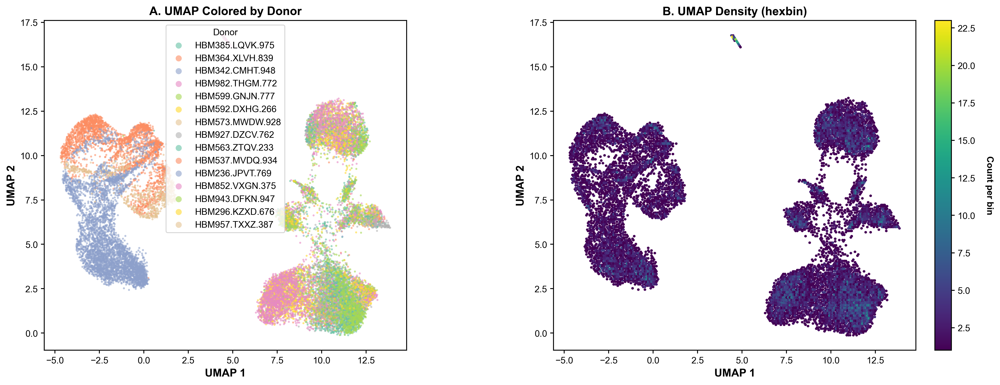

In [12]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Get UMAP coordinates
umap_coords = adata.obsm["X_umap"]

# Panel A: UMAP colored by donor
donors = adata.obs["hubmap_id"].unique()
n_donors = len(donors)
palette = sns.color_palette("Set2", n_colors=n_donors)
donor_colors = dict(zip(donors, palette))

for donor in donors:
    mask = adata.obs["hubmap_id"] == donor
    ax1.scatter(
        umap_coords[mask, 0],
        umap_coords[mask, 1],
        c=[donor_colors[donor]],
        label=donor,
        s=5,
        alpha=0.6,
        edgecolors="none",
    )

ax1.set_xlabel("UMAP 1", fontsize=12, fontweight="bold")
ax1.set_ylabel("UMAP 2", fontsize=12, fontweight="bold")
ax1.set_title("A. UMAP Colored by Donor", fontsize=13, fontweight="bold")
ax1.legend(title="Donor", frameon=True, markerscale=3, loc="best")
ax1.set_aspect("equal")

# Panel B: Density plot (hexbin — faster and bandwidth-independent)
hb = ax2.hexbin(
    umap_coords[:, 0],
    umap_coords[:, 1],
    gridsize=200,
    cmap="viridis",
    mincnt=1,
)
ax2.set_xlabel("UMAP 1", fontsize=12, fontweight="bold")
ax2.set_ylabel("UMAP 2", fontsize=12, fontweight="bold")
ax2.set_title("B. UMAP Density (hexbin)", fontsize=13, fontweight="bold")
ax2.set_aspect("equal")

cbar = plt.colorbar(hb, ax=ax2, fraction=0.046, pad=0.04)
cbar.set_label("Count per bin", rotation=270, labelpad=20, fontweight="bold")

plt.tight_layout()
plt.savefig(figures_dir / "Sx2_umap_donor_density.png", bbox_inches="tight")
plt.savefig(figures_dir / "Sx2_umap_donor_density.pdf", bbox_inches="tight")
print(f"✓ Figure Sx2 saved: UMAP by donor + density")
print(f"  Donors: {n_donors}")
print(f"  Interpretation: Check for donor mixing vs segregation")
plt.show()

S3: UMAP by clusters (Leiden)

Computing Leiden clustering...


/var/folders/g4/m4yltzqj0c79mflv15hj0b3w0000gn/T/ipykernel_91634/401327825.py:3: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata, resolution=1.0, random_state=RANDOM_SEED)


  → 14 clusters identified
✓ Figure Sx3 saved: UMAP with Leiden clusters
  Cluster size range: 136 - 5,309 nuclei


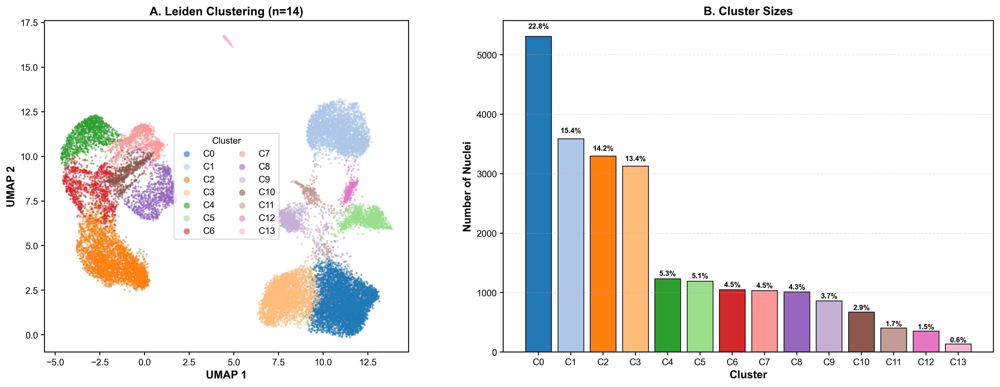

In [13]:
# Compute Leiden clustering
print("Computing Leiden clustering...")
sc.tl.leiden(adata, resolution=1.0, random_state=RANDOM_SEED)

n_clusters = len(adata.obs["leiden"].unique())
print(f"  → {n_clusters} clusters identified")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Panel A: UMAP colored by cluster
clusters = adata.obs["leiden"].astype(int).values
cluster_colors = sns.color_palette("tab20", n_colors=n_clusters)

for cluster_id in sorted(np.unique(clusters)):
    mask = clusters == cluster_id
    ax1.scatter(
        umap_coords[mask, 0],
        umap_coords[mask, 1],
        c=[cluster_colors[cluster_id]],
        label=f"C{cluster_id}",
        s=5,
        alpha=0.6,
        edgecolors="none",
    )

ax1.set_xlabel("UMAP 1", fontsize=12, fontweight="bold")
ax1.set_ylabel("UMAP 2", fontsize=12, fontweight="bold")
ax1.set_title(f"A. Leiden Clustering (n={n_clusters})", fontsize=13, fontweight="bold")
ax1.legend(title="Cluster", frameon=True, markerscale=3, ncol=2, loc="best")
ax1.set_aspect("equal")

# Panel B: Cluster sizes
cluster_counts = adata.obs["leiden"].value_counts().sort_index()

ax2.bar(
    range(len(cluster_counts)),
    cluster_counts.values,
    color=cluster_colors[: len(cluster_counts)],
    edgecolor="black",
    linewidth=0.8,
)
ax2.set_xlabel("Cluster", fontsize=12, fontweight="bold")
ax2.set_ylabel("Number of Nuclei", fontsize=12, fontweight="bold")
ax2.set_title("B. Cluster Sizes", fontsize=13, fontweight="bold")
ax2.set_xticks(range(len(cluster_counts)))
ax2.set_xticklabels([f"C{i}" for i in cluster_counts.index])
ax2.grid(axis="y", alpha=0.3, linestyle="--")

# Add percentage labels
for i, (cluster, count) in enumerate(cluster_counts.items()):
    pct = 100 * count / len(adata)
    ax2.text(
        i,
        count + 0.02 * count,
        f"{pct:.1f}%",
        ha="center",
        va="bottom",
        fontsize=8,
        fontweight="bold",
    )

plt.tight_layout()
plt.savefig(figures_dir / "Sx3_umap_leiden_clusters.png", bbox_inches="tight")
plt.savefig(figures_dir / "Sx3_umap_leiden_clusters.pdf", bbox_inches="tight")
print(f"✓ Figure Sx3 saved: UMAP with Leiden clusters")
print(
    f"  Cluster size range: {cluster_counts.min():,} - {cluster_counts.max():,} nuclei"
)
plt.show()

S4: Canonical heart marker expression on UMAP

⚠ Marker MYH6 not found in dataset
⚠ Marker COL1A1 not found in dataset
Found 6/8 markers: ['TNNT2', 'MYH7', 'PECAM1', 'VWF', 'DCN', 'PTPRC']
✓ Figure Sx4 saved: Canonical heart markers on UMAP


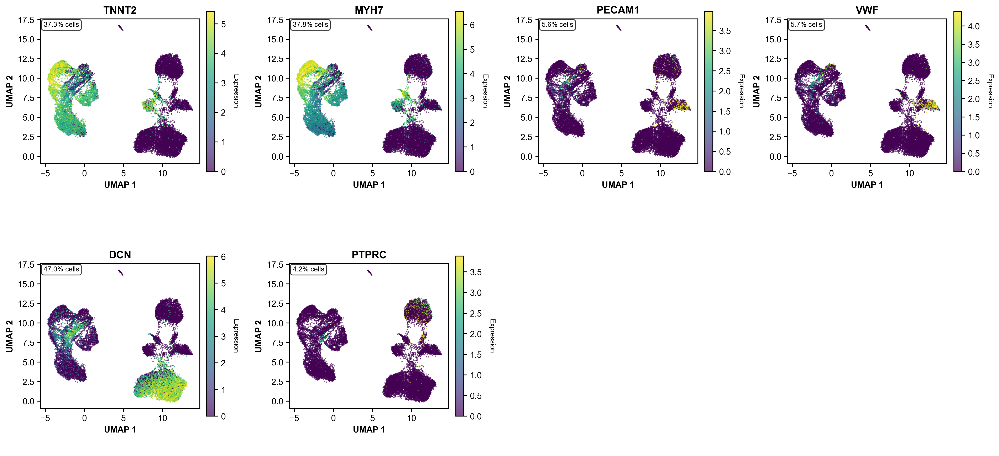

In [14]:
# Define canonical markers
markers = {
    "Cardiomyocyte": ["TNNT2", "MYH6", "MYH7"],
    "Endothelial": ["PECAM1", "VWF"],
    "Fibroblast": ["COL1A1", "DCN"],
    "Immune": ["PTPRC"],
}

# Flatten marker list
all_markers = [m for markers_list in markers.values() for m in markers_list]

# Find markers in dataset (match by hugo_symbol, handle duplicates)
marker_indices = {}
for marker in all_markers:
    mask = adata.var["hugo_symbol"].str.upper() == marker.upper()
    hits = adata.var_names[mask]

    if len(hits) == 0:
        print(f"⚠ Marker {marker} not found in dataset")
    elif len(hits) == 1:
        marker_indices[marker] = hits[0]
    else:
        means = np.array([
            adata[:, h].X.toarray().mean() if sparse.issparse(adata.X)
            else adata[:, h].X.mean()
            for h in hits
        ])
        best = hits[means.argmax()]
        marker_indices[marker] = best
        print(f"⚠ {marker}: {len(hits)} matches — selected {best} (highest mean expr)")

found_markers = list(marker_indices.keys())
print(f"Found {len(found_markers)}/{len(all_markers)} markers: {found_markers}")

# Create figure
n_markers = len(found_markers)
ncols = 4
nrows = int(np.ceil(n_markers / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(16, 4 * nrows))
axes = axes.flatten() if n_markers > 1 else [axes]

for idx, marker in enumerate(found_markers):
    ax = axes[idx]

    # Get expression values
    gene_idx = marker_indices[marker]
    expr = (
        adata[:, gene_idx].X.toarray().flatten()
        if sparse.issparse(adata.X)
        else adata[:, gene_idx].X.flatten()
    )

    # Plot with colormap
    scatter = ax.scatter(
        umap_coords[:, 0],
        umap_coords[:, 1],
        c=expr,
        cmap="viridis",
        s=2,
        alpha=0.7,
        edgecolors="none",
        vmin=0,
        vmax=np.percentile(expr, 99),
    )

    ax.set_xlabel("UMAP 1", fontsize=10, fontweight="bold")
    ax.set_ylabel("UMAP 2", fontsize=10, fontweight="bold")
    ax.set_title(f"{marker}", fontsize=12, fontweight="bold")
    ax.set_aspect("equal")

    cbar = plt.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Expression", rotation=270, labelpad=15, fontsize=8)

    expr_pct = (expr > 0).sum() / len(expr) * 100
    ax.text(
        0.02,
        0.98,
        f"{expr_pct:.1f}% cells",
        transform=ax.transAxes,
        fontsize=8,
        va="top",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.8),
    )

# Hide unused subplots
for idx in range(len(found_markers), len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.savefig(figures_dir / "Sx4_canonical_markers_umap.png", bbox_inches="tight")
plt.savefig(figures_dir / "Sx4_canonical_markers_umap.pdf", bbox_inches="tight")
print(f"✓ Figure Sx4 saved: Canonical heart markers on UMAP")
plt.show()

S5: kNN graph connectivity diagnostics

Graph connectivity analysis:
  Nodes: 23,279
  Expected degree (k): 15
  Unweighted degree — mean: 21.6, std: 10.55, range: [14, 163]
  Weighted strength — mean: 10.36, std: 6.03
  Connected components: 1
✓ Figure Sx5 saved: kNN graph connectivity diagnostics
  ✓ PASSED: Single connected component


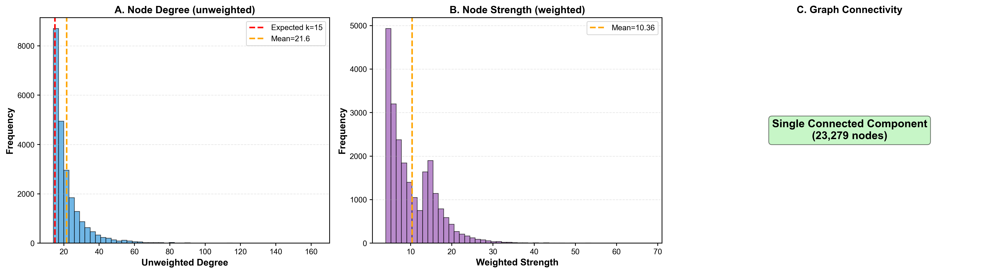

In [15]:
# Get connectivity matrix
conn = adata.obsp["connectivities"]

# Unweighted degree (number of nonzero edges per node)
degree = np.array((conn > 0).sum(axis=1)).flatten()

# Weighted strength (sum of edge weights per node)
strength = np.array(conn.sum(axis=1)).flatten()

# Find connected components
n_components, labels = csgraph.connected_components(conn, directed=False)
component_sizes = np.bincount(labels)

print(f"Graph connectivity analysis:")
print(f"  Nodes: {conn.shape[0]:,}")
print(f"  Expected degree (k): {N_NEIGHBORS}")
print(f"  Unweighted degree — mean: {degree.mean():.1f}, std: {degree.std():.2f}, "
      f"range: [{degree.min()}, {degree.max()}]")
print(f"  Weighted strength — mean: {strength.mean():.2f}, std: {strength.std():.2f}")
print(f"  Connected components: {n_components}")
if n_components > 1:
    print(f"  Largest component: {component_sizes.max():,} nodes")
    print(f"  Smallest component: {component_sizes.min()} nodes")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Panel A: Unweighted degree distribution
axes[0].hist(degree, bins=50, color="#3498db", edgecolor="black",
             linewidth=0.8, alpha=0.7)
axes[0].axvline(x=N_NEIGHBORS, color="red", linestyle="--", linewidth=2,
                label=f"Expected k={N_NEIGHBORS}")
axes[0].axvline(x=degree.mean(), color="orange", linestyle="--", linewidth=2,
                label=f"Mean={degree.mean():.1f}")
axes[0].set_xlabel("Unweighted Degree", fontsize=12, fontweight="bold")
axes[0].set_ylabel("Frequency", fontsize=12, fontweight="bold")
axes[0].set_title("A. Node Degree (unweighted)", fontsize=13, fontweight="bold")
axes[0].legend(frameon=True)
axes[0].grid(axis="y", alpha=0.3, linestyle="--")

# Panel B: Weighted strength distribution
axes[1].hist(strength, bins=50, color="#9b59b6", edgecolor="black",
             linewidth=0.8, alpha=0.7)
axes[1].axvline(x=strength.mean(), color="orange", linestyle="--", linewidth=2,
                label=f"Mean={strength.mean():.2f}")
axes[1].set_xlabel("Weighted Strength", fontsize=12, fontweight="bold")
axes[1].set_ylabel("Frequency", fontsize=12, fontweight="bold")
axes[1].set_title("B. Node Strength (weighted)", fontsize=13, fontweight="bold")
axes[1].legend(frameon=True)
axes[1].grid(axis="y", alpha=0.3, linestyle="--")

# Panel C: Connected component sizes
if n_components > 1:
    component_sizes_sorted = np.sort(component_sizes)[::-1]
    axes[2].bar(range(len(component_sizes_sorted)), component_sizes_sorted,
                color="#27ae60", edgecolor="black", linewidth=0.8)
    axes[2].set_xlabel("Component Rank", fontsize=12, fontweight="bold")
    axes[2].set_ylabel("Component Size", fontsize=12, fontweight="bold")
    axes[2].set_title(f"C. Connected Components (n={n_components})",
                      fontsize=13, fontweight="bold")
    axes[2].set_yscale("log")
    axes[2].grid(axis="y", alpha=0.3, linestyle="--")
else:
    axes[2].text(
        0.5, 0.5,
        f"Single Connected Component\n({conn.shape[0]:,} nodes)",
        ha="center", va="center", fontsize=14, fontweight="bold",
        transform=axes[2].transAxes,
        bbox=dict(boxstyle="round", facecolor="lightgreen", alpha=0.5),
    )
    axes[2].set_title("C. Graph Connectivity", fontsize=13, fontweight="bold")
    axes[2].axis("off")

plt.tight_layout()
plt.savefig(figures_dir / "Sx5_graph_connectivity.png", bbox_inches="tight")
plt.savefig(figures_dir / "Sx5_graph_connectivity.pdf", bbox_inches="tight")
print(f"✓ Figure Sx5 saved: kNN graph connectivity diagnostics")

if n_components == 1:
    print("  ✓ PASSED: Single connected component")
else:
    print(f"  ⚠ WARNING: {n_components} disconnected components detected")
plt.show()

S6: Nearest-neighbor distance distribution

Neighbor distance statistics (PCA space, metric=euclidean):
  Nonzeros per row — mean: 16.0, range: [16, 16]
  Max neighbor distance — mean: 12.0636, median: 13.0148
  Mean neighbor distance — mean: 10.7917, median: 11.6551
  Range: [4.3754, 24.7091]
✓ Figure Sx6 saved: Nearest-neighbor distance distribution


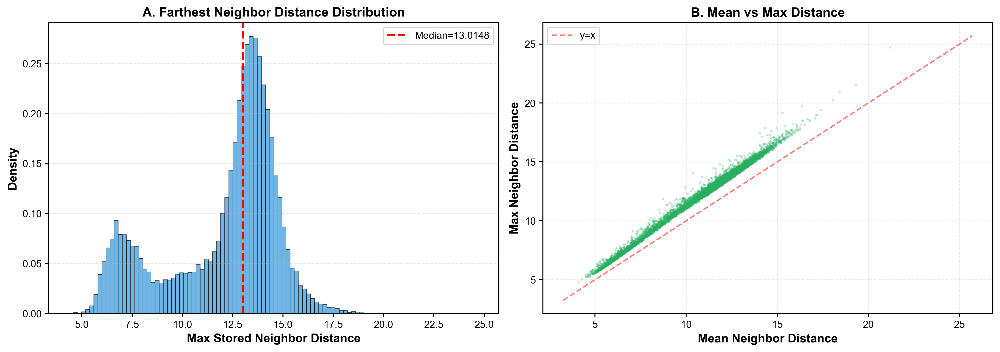

In [17]:
# Get distance matrix (sparse CSR)
dist_matrix = adata.obsp["distances"].tocsr()

# Compute actual nonzeros per row
nnz_per_row = np.diff(dist_matrix.indptr)

# Max stored neighbor distance per row (FIX)
max_neighbor_dist = dist_matrix.max(axis=1).toarray().ravel()

# Mean neighbor distance
row_sums = dist_matrix.sum(axis=1).A1
mean_neighbor_dist = row_sums / np.maximum(nnz_per_row, 1)

print(f"Neighbor distance statistics (PCA space, metric=euclidean):")
print(f"  Nonzeros per row — mean: {nnz_per_row.mean():.1f}, "
      f"range: [{nnz_per_row.min()}, {nnz_per_row.max()}]")
print(f"  Max neighbor distance — mean: {max_neighbor_dist.mean():.4f}, "
      f"median: {np.median(max_neighbor_dist):.4f}")
print(f"  Mean neighbor distance — mean: {mean_neighbor_dist.mean():.4f}, "
      f"median: {np.median(mean_neighbor_dist):.4f}")
print(f"  Range: [{max_neighbor_dist.min():.4f}, {max_neighbor_dist.max():.4f}]")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Panel A: Max stored neighbor distance histogram
ax1.hist(
    max_neighbor_dist, bins=100, color="#3498db", edgecolor="black",
    linewidth=0.5, alpha=0.7, density=True,
)
ax1.axvline(
    x=np.median(max_neighbor_dist), color="red", linestyle="--", linewidth=2,
    label=f"Median={np.median(max_neighbor_dist):.4f}",
)
ax1.set_xlabel("Max Stored Neighbor Distance", fontsize=12, fontweight="bold")
ax1.set_ylabel("Density", fontsize=12, fontweight="bold")
ax1.set_title("A. Farthest Neighbor Distance Distribution",
              fontsize=13, fontweight="bold")
ax1.legend(frameon=True)
ax1.grid(axis="y", alpha=0.3, linestyle="--")

# Panel B: Mean neighbor distance vs max distance (shows uniformity)
n_subsample = min(10000, len(max_neighbor_dist))
subsample_idx = rng.choice(len(max_neighbor_dist), n_subsample, replace=False)

ax2.scatter(
    mean_neighbor_dist[subsample_idx],
    max_neighbor_dist[subsample_idx],
    s=5, alpha=0.3, color="#27ae60", edgecolors="none",
)
ax2.set_xlabel("Mean Neighbor Distance", fontsize=12, fontweight="bold")
ax2.set_ylabel("Max Neighbor Distance", fontsize=12, fontweight="bold")
ax2.set_title("B. Mean vs Max Distance", fontsize=13, fontweight="bold")
ax2.grid(True, alpha=0.3, linestyle="--")

lim_min = min(ax2.get_xlim()[0], ax2.get_ylim()[0])
lim_max = max(ax2.get_xlim()[1], ax2.get_ylim()[1])
ax2.plot([lim_min, lim_max], [lim_min, lim_max], "r--", linewidth=1.5,
         alpha=0.5, label="y=x")
ax2.legend(frameon=True)

plt.tight_layout()
plt.savefig(figures_dir / "Sx6_neighbor_distances.png", bbox_inches="tight")
plt.savefig(figures_dir / "Sx6_neighbor_distances.pdf", bbox_inches="tight")
print(f"✓ Figure Sx6 saved: Nearest-neighbor distance distribution")
plt.show()

S7: Moran's I null sanity check

Weight matrix: (23279, 23279), nnz=503278, row-normalized (each row sums to 1)
Computing Moran's I for Positive: TNNT2 (100-perm smoke test)...
  I_obs = 0.8427, p = 0.000
Computing Moran's I for Ubiquitous: RPLP0 (100-perm smoke test)...
  I_obs = 0.1518, p = 0.000
Random gene panel (n=20): mean I = 0.0097, sd = 0.0167
✓ Figure Sx7 saved: Moran's I null sanity check (row-normalized W, 100-perm smoke test)


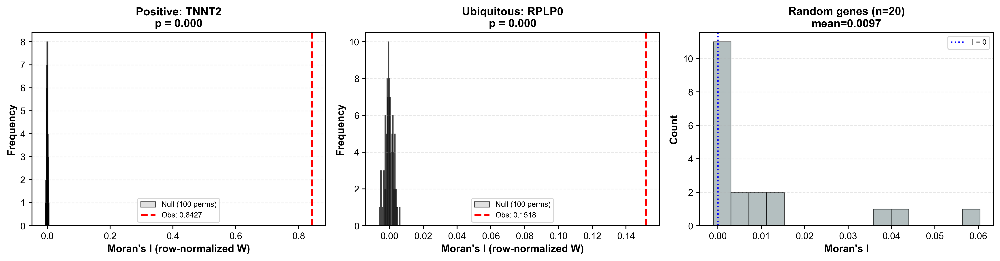

In [20]:
def compute_morans_i(expr, W):
    """
    Compute Moran's I with row-normalized weight matrix.

    Formula: I = (n / S0) * (z^T W z) / (z^T z)
    where z = x - mean(x), S0 = sum of all weights,
    and W is row-normalized so each row sums to 1.
    """
    n = len(expr)
    z = expr - expr.mean()
    zTz = z @ z
    if zTz == 0:
        return 0.0
    S0 = W.sum()
    if S0 == 0:
        return 0.0
    return (n / S0) * (z @ (W @ z)) / zTz


def permutation_test(expr, W, n_perms=100, rng=None):
    """Compute null distribution by permuting expression labels."""
    if rng is None:
        rng = np.random.default_rng()
    I_obs = compute_morans_i(expr, W)
    I_null = np.zeros(n_perms)
    for i in range(n_perms):
        I_null[i] = compute_morans_i(rng.permutation(expr), W)
    return I_obs, I_null


# --- Row-normalize the connectivity matrix ---
# This ensures each cell's neighbors contribute equally regardless of degree.
W_raw = adata.obsp["connectivities"].tocsr().astype(np.float64)
row_sums = np.array(W_raw.sum(axis=1)).flatten()
# Avoid division by zero for any disconnected cells
row_sums[row_sums == 0] = 1.0
W = W_raw.multiply(1.0 / row_sums[:, np.newaxis]).tocsr()
print(f"Weight matrix: {W.shape}, nnz={W.nnz}, row-normalized (each row sums to 1)")

# --- Select test genes ---
# Positive control: TNNT2 (cardiac muscle marker, should show strong spatial clustering)
# Weak control: RPLP0 (ubiquitous ribosomal gene, ~uniform expression → I ≈ 0)
# Random genes: 20 random genes to form a null baseline
test_genes = {
    "Positive: TNNT2": "TNNT2",
    "Ubiquitous: RPLP0": "RPLP0",
}

gene_results = {}

for label, gene_name in test_genes.items():
    mask = adata.var["hugo_symbol"].str.upper() == gene_name.upper()
    if not mask.any():
        print(f"⚠ Gene {gene_name} not found, skipping")
        continue
    gene_idx = adata.var_names[mask][0]
    expr = (
        adata[:, gene_idx].X.toarray().flatten()
        if scipy.sparse.issparse(adata.X)
        else adata[:, gene_idx].X.flatten()
    )
    print(f"Computing Moran's I for {label} (100-perm smoke test)...")
    I_obs, I_null = permutation_test(expr, W, n_perms=100, rng=rng)
    p_val = (np.abs(I_null) >= np.abs(I_obs)).sum() / len(I_null)
    gene_results[label] = {
        "I_obs": I_obs, "I_null": I_null,
        "p_val": p_val, "gene_name": gene_name,
    }
    print(f"  I_obs = {I_obs:.4f}, p = {p_val:.3f}")

# Random gene panel (20 genes)
n_random = 20
random_idxs = rng.choice(adata.n_vars, n_random, replace=False)
random_Is = []
for ri in random_idxs:
    gidx = adata.var_names[ri]
    expr = (
        adata[:, gidx].X.toarray().flatten()
        if scipy.sparse.issparse(adata.X)
        else adata[:, gidx].X.flatten()
    )
    random_Is.append(compute_morans_i(expr, W))
random_Is = np.array(random_Is)
print(f"Random gene panel (n={n_random}): mean I = {random_Is.mean():.4f}, "
      f"sd = {random_Is.std():.4f}")

# --- Plot ---
n_panels = len(gene_results) + 1  # +1 for random panel
fig, axes = plt.subplots(1, n_panels, figsize=(5 * n_panels, 4))
if n_panels == 1:
    axes = [axes]

for ax, (label, res) in zip(axes, gene_results.items()):
    ax.hist(res["I_null"], bins=30, color="lightgray", edgecolor="black",
            linewidth=0.8, alpha=0.7, label="Null (100 perms)")
    ax.axvline(x=res["I_obs"], color="red", linestyle="--", linewidth=2,
               label=f"Obs: {res['I_obs']:.4f}")
    ax.set_xlabel("Moran's I (row-normalized W)", fontsize=11, fontweight="bold")
    ax.set_ylabel("Frequency", fontsize=11, fontweight="bold")
    ax.set_title(f"{label}\np = {res['p_val']:.3f}", fontsize=12, fontweight="bold")
    ax.legend(frameon=True, fontsize=8)
    ax.grid(axis="y", alpha=0.3, linestyle="--")

# Random panel: distribution of I across 20 random genes
ax_rand = axes[-1]
ax_rand.hist(random_Is, bins=15, color="#95a5a6", edgecolor="black",
             linewidth=0.8, alpha=0.7)
ax_rand.axvline(x=0, color="blue", linestyle=":", linewidth=1.5, label="I = 0")
ax_rand.set_xlabel("Moran's I", fontsize=11, fontweight="bold")
ax_rand.set_ylabel("Count", fontsize=11, fontweight="bold")
ax_rand.set_title(f"Random genes (n={n_random})\nmean={random_Is.mean():.4f}",
                  fontsize=12, fontweight="bold")
ax_rand.legend(frameon=True, fontsize=8)
ax_rand.grid(axis="y", alpha=0.3, linestyle="--")

plt.tight_layout()
plt.savefig(figures_dir / "Sx7_morans_i_sanity.png", bbox_inches="tight")
plt.savefig(figures_dir / "Sx7_morans_i_sanity.pdf", bbox_inches="tight")
print(f"✓ Figure Sx7 saved: Moran's I null sanity check (row-normalized W, 100-perm smoke test)")
plt.show()

S8: UMAP stability across seeds

Testing UMAP stability with seeds: [42, 733, 481, 233, 314, 884]


/var/folders/g4/m4yltzqj0c79mflv15hj0b3w0000gn/T/ipykernel_91634/637577788.py:9: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata, resolution=1.0, random_state=RANDOM_SEED)


Reference Leiden: 14 clusters (computed once on fixed graph)
Testing UMAP stability across seeds...
  Computing UMAP with seed=42...
  Computing UMAP with seed=733...
  Computing UMAP with seed=481...
  Computing UMAP with seed=233...
  Computing UMAP with seed=314...
  Computing UMAP with seed=884...
Seeds 42 vs 733: Procrustes distance = 0.016855
Seeds 42 vs 481: Procrustes distance = 0.002942
Seeds 42 vs 233: Procrustes distance = 0.022568
Seeds 42 vs 314: Procrustes distance = 0.002748
Seeds 42 vs 884: Procrustes distance = 0.029333
Seeds 733 vs 481: Procrustes distance = 0.014114
Seeds 733 vs 233: Procrustes distance = 0.003696
Seeds 733 vs 314: Procrustes distance = 0.015962
Seeds 733 vs 884: Procrustes distance = 0.010632
Seeds 481 vs 233: Procrustes distance = 0.018429
Seeds 481 vs 314: Procrustes distance = 0.004707
Seeds 481 vs 884: Procrustes distance = 0.023412
Seeds 233 vs 314: Procrustes distance = 0.020213
Seeds 233 vs 884: Procrustes distance = 0.008423
Seeds 314 vs 884

/var/folders/g4/m4yltzqj0c79mflv15hj0b3w0000gn/T/ipykernel_91634/637577788.py:107: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Andale Mono.
  plt.savefig(figures_dir / "Sx8_umap_stability.png", bbox_inches="tight")
/var/folders/g4/m4yltzqj0c79mflv15hj0b3w0000gn/T/ipykernel_91634/637577788.py:108: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Andale Mono.
  plt.savefig(figures_dir / "Sx8_umap_stability.pdf", bbox_inches="tight")
/var/folders/g4/m4yltzqj0c79mflv15hj0b3w0000gn/T/ipykernel_91634/637577788.py:108: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Andale Mono.
  plt.savefig(figures_dir / "Sx8_umap_stability.pdf", bbox_inches="tight")


✓ Figure Sx8 saved: UMAP stability across seeds
  Mean Procrustes: 0.014632, Median: 0.015962
  (CHECK ⚠)


/Users/cytronicoder/Documents/GitHub/biorsp-topaz/.venv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Andale Mono.
  fig.canvas.print_figure(bytes_io, **kw)


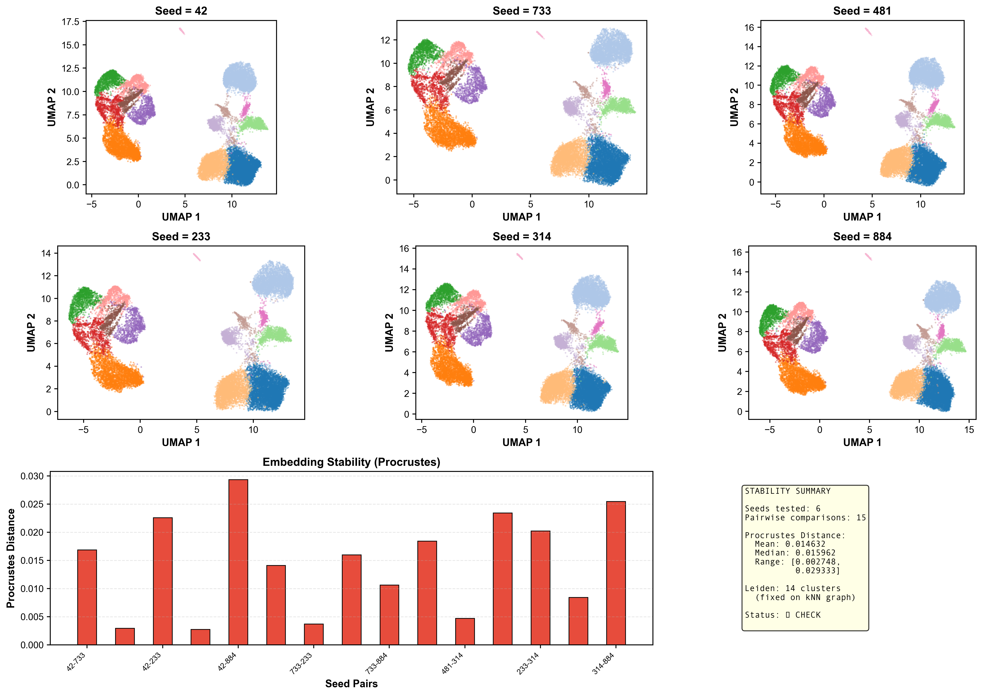

In [24]:
all_possible_seeds = list(range(1, 1000))
all_possible_seeds.remove(42)
selected_random_seeds = rng.choice(all_possible_seeds, 5, replace=False).tolist()
test_seeds = [42] + selected_random_seeds
print(f"Testing UMAP stability with seeds: {test_seeds}")
umap_embeddings = {}

# --- Compute Leiden ONCE on the fixed kNN graph for consistent coloring ---
sc.tl.leiden(adata, resolution=1.0, random_state=RANDOM_SEED)
reference_leiden = adata.obs["leiden"].values.copy()
print(f"Reference Leiden: {len(np.unique(reference_leiden))} clusters (computed once on fixed graph)")

print("Testing UMAP stability across seeds...")
for seed in test_seeds:
    print(f"  Computing UMAP with seed={seed}...")
    # Work on a copy so we never mutate adata's embeddings
    adata_tmp = adata.copy()
    sc.tl.umap(adata_tmp, min_dist=MIN_DIST, spread=SPREAD, random_state=seed)
    umap_embeddings[seed] = adata_tmp.obsm["X_umap"].copy()
    del adata_tmp

# Restore the reference UMAP (seed 42) into adata
adata.obsm["X_umap"] = umap_embeddings[42]

# Compute pairwise Procrustes distances
procrustes_dists = {}

for seed1, seed2 in combinations(test_seeds, 2):
    mtx1, mtx2, disparity = procrustes(umap_embeddings[seed1], umap_embeddings[seed2])
    procrustes_dists[f"{seed1}-{seed2}"] = disparity
    print(f"Seeds {seed1} vs {seed2}: Procrustes distance = {disparity:.6f}")

# Plot comparison — 2 rows of 3 UMAPs + metrics below
fig = plt.figure(figsize=(18, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# Top 2 rows: UMAPs colored by fixed Leiden (6 panels: 2 rows × 3 cols)
clusters_int = reference_leiden.astype(int)
n_clusters = len(np.unique(clusters_int))
colors = sns.color_palette("tab20", n_colors=n_clusters)

for idx, seed in enumerate(test_seeds):
    row = idx // 3  # 0 for first 3, 1 for last 3
    col = idx % 3   # 0, 1, 2
    ax = fig.add_subplot(gs[row, col])
    
    for cluster_id in np.unique(clusters_int):
        mask = clusters_int == cluster_id
        ax.scatter(
            umap_embeddings[seed][mask, 0],
            umap_embeddings[seed][mask, 1],
            c=[colors[cluster_id]],
            s=3, alpha=0.5, edgecolors="none",
        )
    ax.set_xlabel("UMAP 1", fontsize=11, fontweight="bold")
    ax.set_ylabel("UMAP 2", fontsize=11, fontweight="bold")
    ax.set_title(f"Seed = {seed}", fontsize=12, fontweight="bold")
    ax.set_aspect("equal")

# Bottom row: Procrustes distances (left 2 cols) and summary box (right col)
ax_proc = fig.add_subplot(gs[2, 0:2])
comparisons = list(procrustes_dists.keys())
proc_vals = list(procrustes_dists.values())
x = np.arange(len(comparisons))

bars = ax_proc.bar(
    x, proc_vals, 0.5,
    color="#e74c3c", edgecolor="black", linewidth=0.8,
)
ax_proc.set_ylabel("Procrustes Distance", fontsize=11, fontweight="bold")
ax_proc.set_xlabel("Seed Pairs", fontsize=11, fontweight="bold")
ax_proc.set_xticks(x[::2])  # Show every 2nd label to avoid crowding
ax_proc.set_xticklabels([comparisons[i] for i in range(0, len(comparisons), 2)], 
                         rotation=45, ha="right", fontsize=8)
ax_proc.set_title("Embedding Stability (Procrustes)", fontsize=12, fontweight="bold")
ax_proc.grid(axis="y", alpha=0.3, linestyle="--")

# Summary box
ax_summary = fig.add_subplot(gs[2, 2])
ax_summary.axis("off")

mean_proc = np.mean(proc_vals)
median_proc = np.median(proc_vals)

summary_text = f"""STABILITY SUMMARY

Seeds tested: {len(test_seeds)}
Pairwise comparisons: {len(proc_vals)}

Procrustes Distance:
  Mean: {mean_proc:.6f}
  Median: {median_proc:.6f}
  Range: [{min(proc_vals):.6f},
          {max(proc_vals):.6f}]

Leiden: {n_clusters} clusters
  (fixed on kNN graph)

Status: {'✓ STABLE' if mean_proc < 0.01 else '⚠ CHECK'}
"""

ax_summary.text(
    0.05, 0.5, summary_text, fontsize=9, family="monospace", va="center",
    bbox=dict(boxstyle="round", facecolor="lightyellow", alpha=0.8),
)

plt.savefig(figures_dir / "Sx8_umap_stability.png", bbox_inches="tight")
plt.savefig(figures_dir / "Sx8_umap_stability.pdf", bbox_inches="tight")
print(f"✓ Figure Sx8 saved: UMAP stability across seeds")
print(f"  Mean Procrustes: {mean_proc:.6f}, Median: {median_proc:.6f}")
print(f"  {'(STABLE ✓)' if mean_proc < 0.01 else '(CHECK ⚠)'}")
plt.show()

S9: Parameter sweep (n_neighbors × n_pcs)

Running parameter sweep...
  n_neighbors: [10, 15, 30]
  n_pcs: [30, 50]
  Computing pcs=30_k=10...
  Computing pcs=30_k=15...
  Computing pcs=30_k=30...
  Computing pcs=50_k=10...
  Computing pcs=50_k=15...
  Computing pcs=50_k=30...
✓ Figure Sx9 saved: Parameter sweep (n_neighbors × n_pcs)
  Reference parameters (red border): n_pcs=50, k=15
  Note: adata unchanged — all sweeps used copies


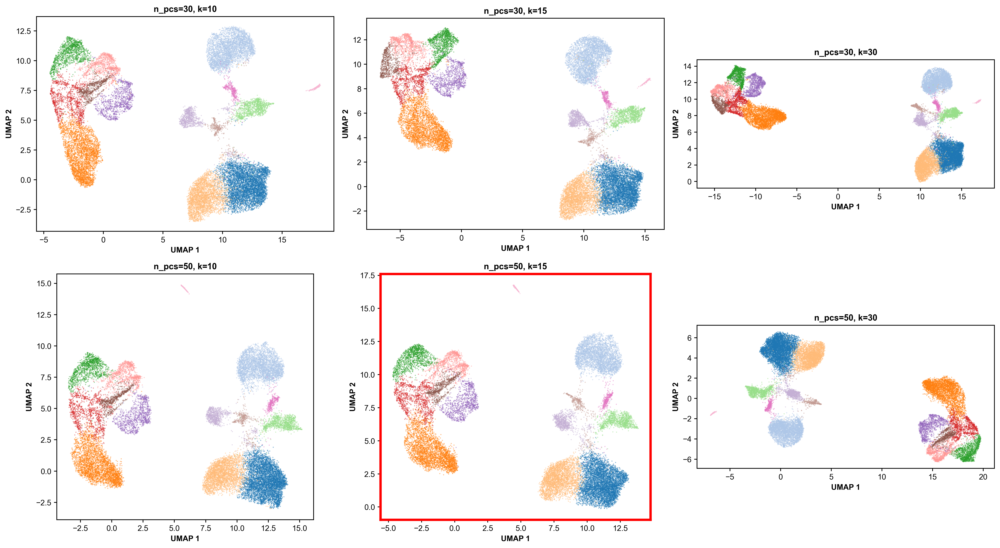

In [25]:
# Parameter grid
n_neighbors_vals = [10, 15, 30]
n_pcs_vals = [30, 50]

print("Running parameter sweep...")
print(f"  n_neighbors: {n_neighbors_vals}")
print(f"  n_pcs: {n_pcs_vals}")

# Store results — each iteration works on a fresh copy
sweep_results = {}

for n_pcs_test in n_pcs_vals:
    for n_neighbors_test in n_neighbors_vals:
        key = f"pcs={n_pcs_test}_k={n_neighbors_test}"
        print(f"  Computing {key}...")

        adata_tmp = adata.copy()
        sc.pp.neighbors(
            adata_tmp,
            n_neighbors=n_neighbors_test,
            n_pcs=n_pcs_test,
            random_state=RANDOM_SEED,
        )
        sc.tl.umap(adata_tmp, min_dist=MIN_DIST, spread=SPREAD, random_state=RANDOM_SEED)

        sweep_results[key] = {
            "umap": adata_tmp.obsm["X_umap"].copy(),
            "n_pcs": n_pcs_test,
            "n_neighbors": n_neighbors_test,
        }
        del adata_tmp

# Plot grid
nrows = len(n_pcs_vals)
ncols = len(n_neighbors_vals)

fig, axes = plt.subplots(nrows, ncols, figsize=(6 * ncols, 5 * nrows))
if nrows == 1 and ncols == 1:
    axes = np.array([[axes]])
elif nrows == 1:
    axes = axes[np.newaxis, :]
elif ncols == 1:
    axes = axes[:, np.newaxis]

# Use reference Leiden clusters (computed once on fixed graph in Sx8)
clusters_int = reference_leiden.astype(int)
n_clusters = len(np.unique(clusters_int))
colors = sns.color_palette("tab20", n_colors=n_clusters)

for row_idx, n_pcs_test in enumerate(n_pcs_vals):
    for col_idx, n_neighbors_test in enumerate(n_neighbors_vals):
        ax = axes[row_idx, col_idx]
        key = f"pcs={n_pcs_test}_k={n_neighbors_test}"
        umap_coords = sweep_results[key]["umap"]

        for cluster_id in np.unique(clusters_int):
            mask = clusters_int == cluster_id
            ax.scatter(
                umap_coords[mask, 0],
                umap_coords[mask, 1],
                c=[colors[cluster_id]],
                s=2, alpha=0.5, edgecolors="none",
            )

        ax.set_xlabel("UMAP 1", fontsize=10, fontweight="bold")
        ax.set_ylabel("UMAP 2", fontsize=10, fontweight="bold")
        ax.set_title(
            f"n_pcs={n_pcs_test}, k={n_neighbors_test}",
            fontsize=11, fontweight="bold",
        )
        ax.set_aspect("equal")

        # Highlight reference parameters
        if n_pcs_test == N_PCS and n_neighbors_test == N_NEIGHBORS:
            for spine in ax.spines.values():
                spine.set_edgecolor("red")
                spine.set_linewidth(3)

plt.tight_layout()
plt.savefig(figures_dir / "Sx9_parameter_sweep.png", bbox_inches="tight")
plt.savefig(figures_dir / "Sx9_parameter_sweep.pdf", bbox_inches="tight")
print(f"✓ Figure Sx9 saved: Parameter sweep (n_neighbors × n_pcs)")
print(f"  Reference parameters (red border): n_pcs={N_PCS}, k={N_NEIGHBORS}")
print("  Note: adata unchanged — all sweeps used copies")
plt.show()